In [37]:
!pip install yfinance -q
!pip install plotly -q
!pip install matplotlib -q
!pip install pandas -q
!pip install ta -q
!pip install tensorflow-macos -q


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import yfinance as yf
import plotly.graph_objects as go  ## better display graphs
import ta

In [3]:
## Example pulling Microsoft Stock

In [4]:
msft = yf.Ticker("MSFT")

In [5]:
hist = msft.history(period="max")

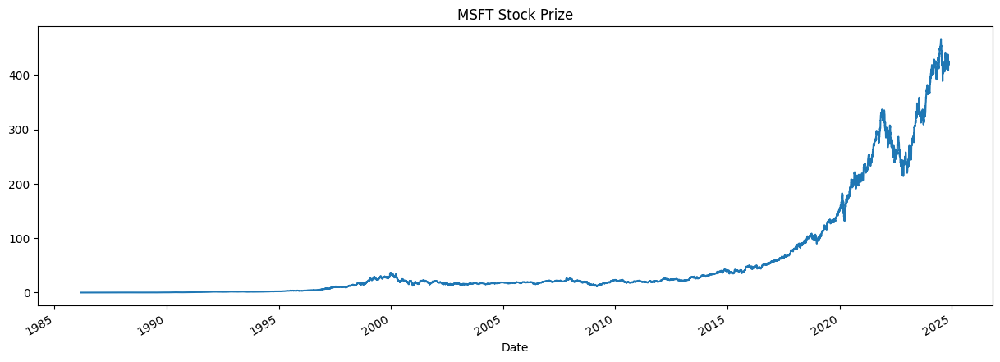

In [6]:
hist['Open'].plot(figsize=(15,5), title = "MSFT Stock Prize")
plt.show()

In [7]:
msft.balance_sheet

,2024-06-30,2023-06-30,2022-06-30,2021-06-30
Ordinary Shares Number,7434000000.0,7432000000.0,7464000000.0,7519000000.0
Share Issued,7434000000.0,7432000000.0,7464000000.0,7519000000.0
Net Debt,33315000000.0,12533000000.0,35850000000.0,43922000000.0
Total Debt,67127000000.0,59965000000.0,61270000000.0,67775000000.0
Tangible Book Value,121660000000.0,128971000000.0,87720000000.0,84477000000.0
...,...,...,...,...
Cash Cash Equivalents And Short Term Investments,75531000000.0,111256000000.0,104749000000.0,130256000000.0
Other Short Term Investments,57216000000.0,76552000000.0,90818000000.0,116032000000.0
Cash And Cash Equivalents,18315000000.0,34704000000.0,13931000000.0,14224000000.0
Cash Equivalents,6744000000.0,26226000000.0,5673000000.0,6952000000.0


In [8]:
msft.calendar

{'Dividend Date': datetime.date(2024, 12, 11),
 'Ex-Dividend Date': datetime.date(2024, 11, 20),
 'Earnings Date': [datetime.date(2025, 1, 28), datetime.date(2025, 2, 3)],
 'Earnings High': 3.47,
 'Earnings Low': 3.08,
 'Earnings Average': 3.16286,
 'Revenue High': 70520000000,
 'Revenue Low': 68488700000,
 'Revenue Average': 68937174200}

In [9]:
## Pulling other stocks
## top 10 stocks to buy in 2024

In [10]:
stonks = ['MSFT','NVDA','GOOGL','META','JPM','XOM','MA','CRM','AMD','AXP','MS']

In [11]:
hists = {}
for s in stonks:
    tkr = yf.Ticker(s)
    history = tkr.history(period='10y')  ## pulling 10 year data
    hists[s] = history

In [12]:
## Plotting the stock prize

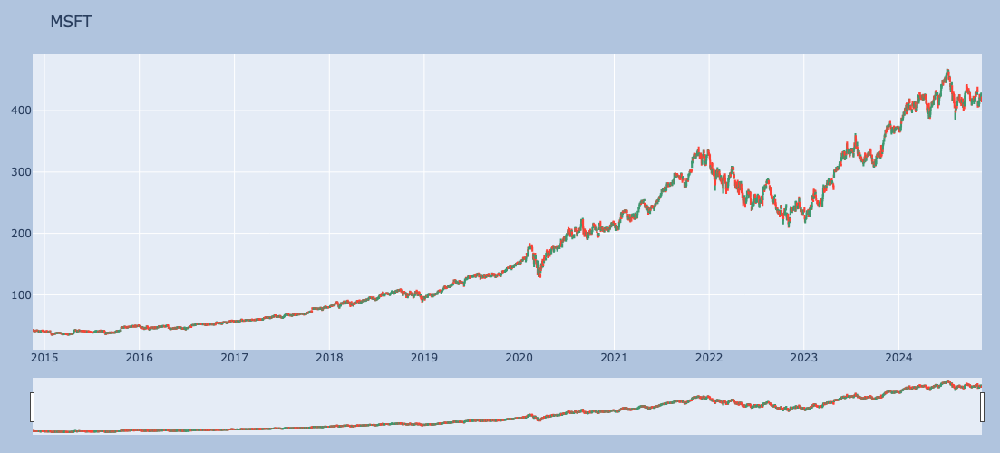

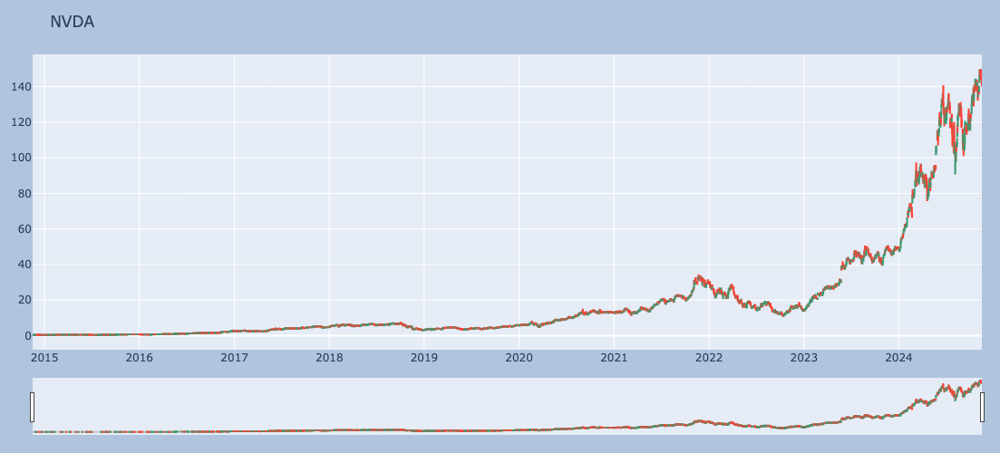

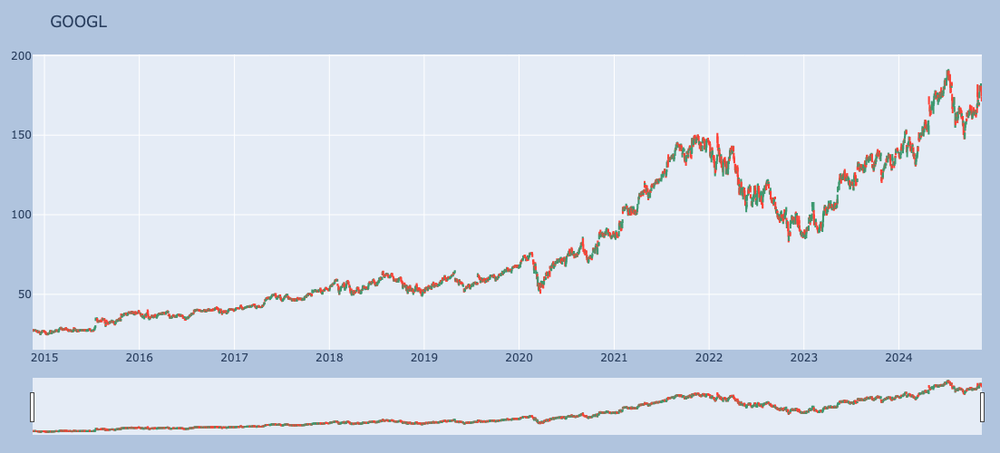

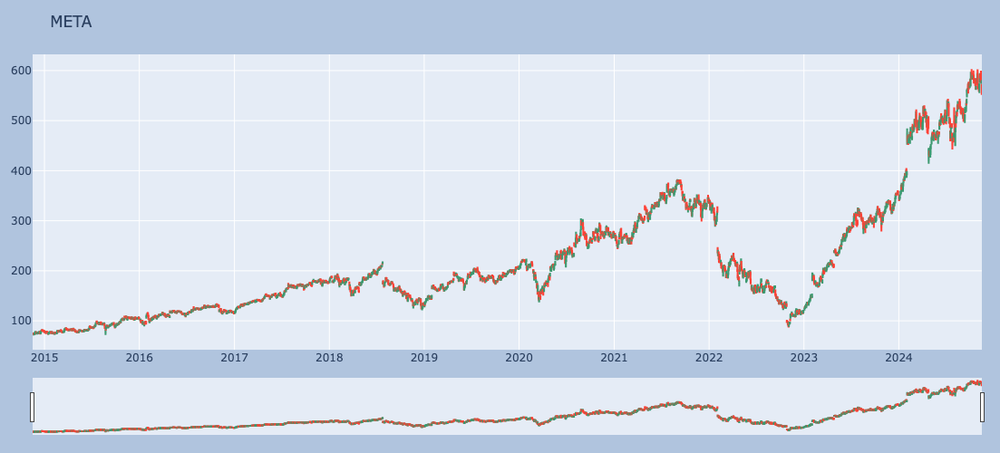

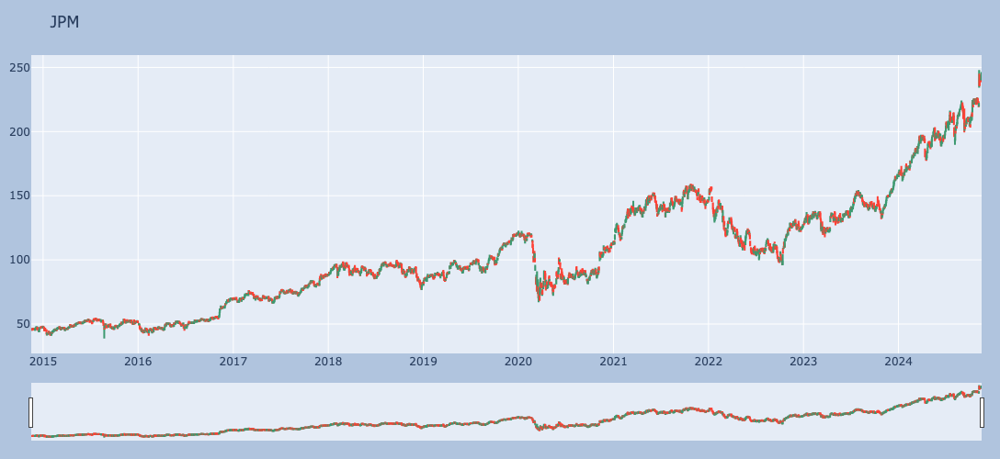

...

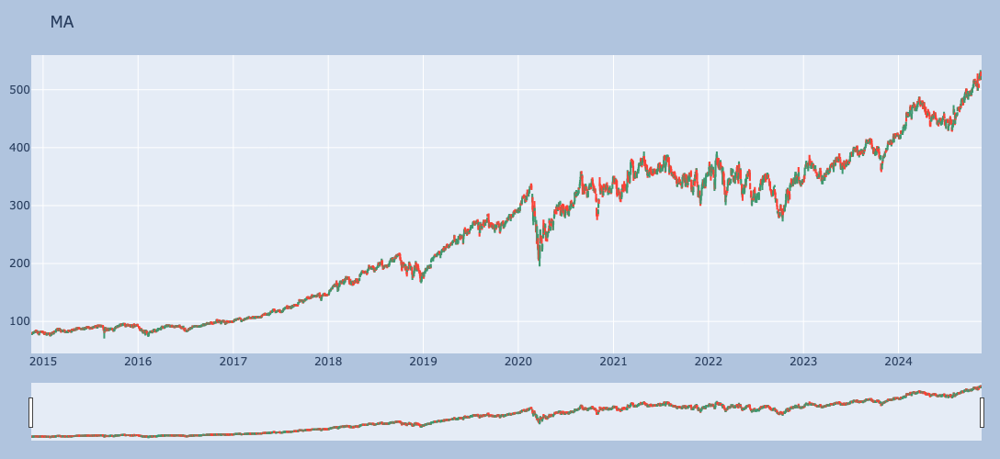

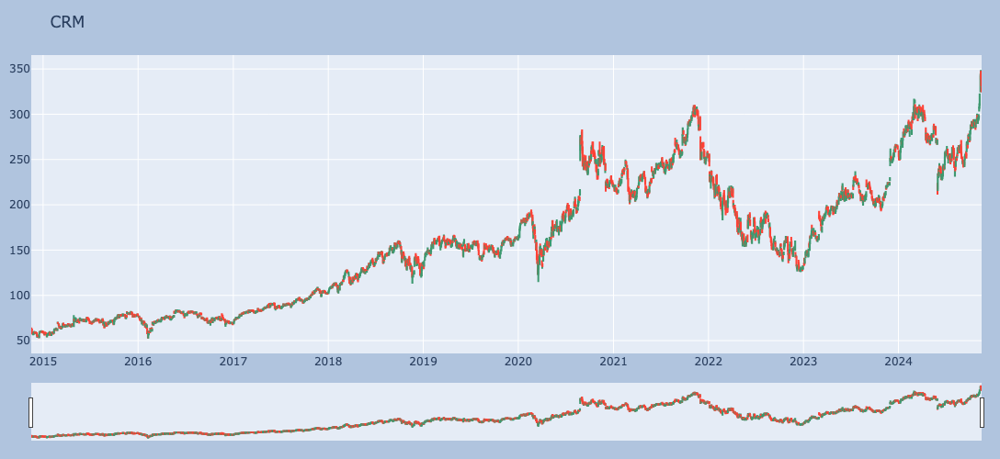

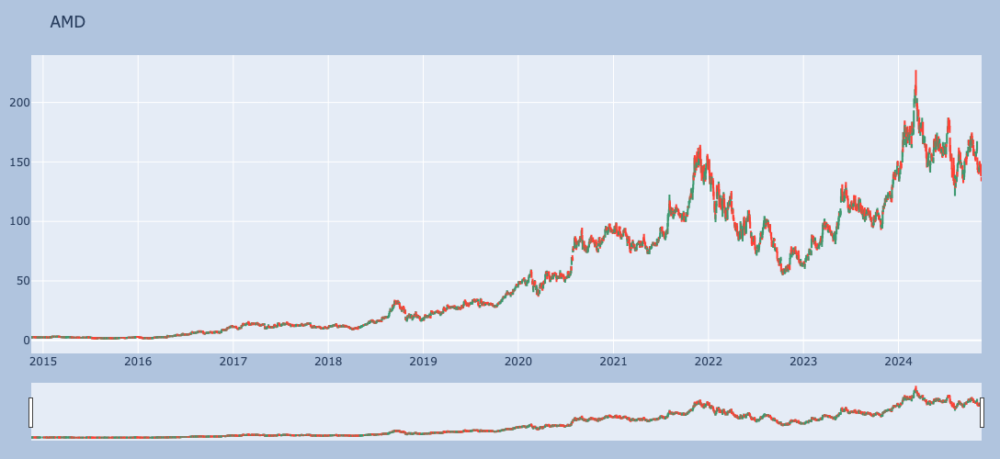

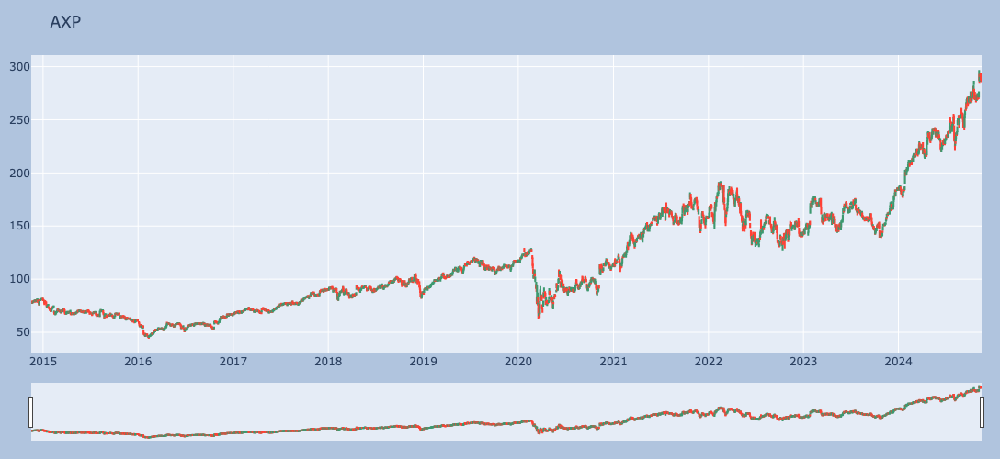

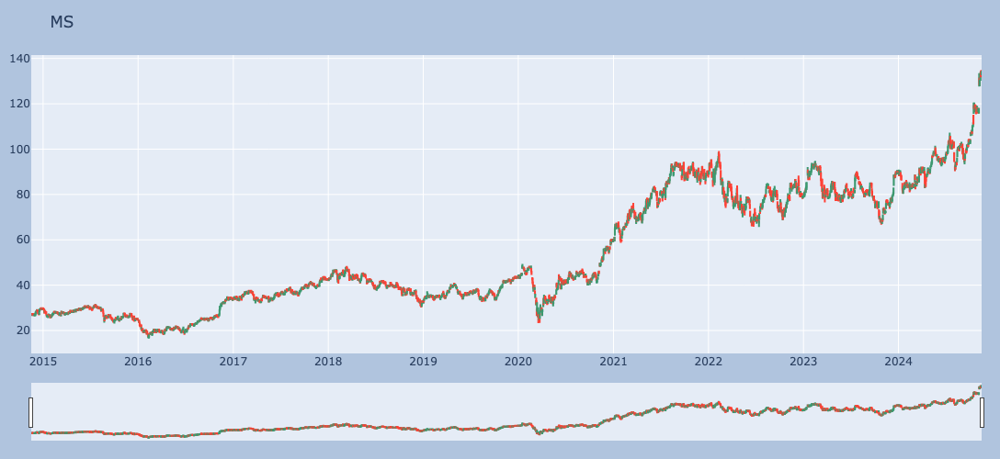

In [13]:
for stock in stonks:
    temp_df = hists[stock].copy()
    
    fig = go.Figure(
        data=[
            go.Candlestick(
                x = temp_df.index,
                open = temp_df["Open"],
                high = temp_df["High"],
                low = temp_df["Low"],
                close = temp_df["Close"],
            )
        ]
    )
    
    fig.update_layout(
        margin = dict(l=20, r=20, t=60, b=20),
        height = 500,
        paper_bgcolor = "LightSteelBlue",
        title = stock,
    )
    
    fig.show()

In [14]:
# Calculating Moving averages
# SMA - Simple Moving Average
# SMA = (Closing Price Day 1 + Closing Price Day 2 + ... + Closing Price Day N) / N
# N = the number of days in the period you are calculating the average for. 

# Moving averages smooth out price fluctuations and help identify trends.

In [38]:
# Adding more advanced features for better predictions
for stock, data in hists.items():
    data['SMA_10'] = data['Close'].rolling(window=10).mean()  # 10-day Simple Moving Average
    data['SMA_50'] = data['Close'].rolling(window=50).mean()  # 50-day Simple Moving Average
    data['EMA_10'] = data['Close'].ewm(span=10, adjust=False).mean()  # Exponential Moving Average
    data['RSI'] = ta.momentum.rsi(data['Close'], window=14)  # Relative Strength Index
    data['MACD'] = ta.trend.macd(data['Close'])  # MACD (Moving Average Convergence Divergence)
    data['Volume_Change'] = data['Volume'].pct_change()  # Volume percentage change
    data.dropna(inplace=True)  # Drop NaN rows caused by rolling calculations

In [16]:
# Splitting the Data into Training and Testing Sets

# The data is split into:
# X_train, y_train (80%): Used to train the model.
# X_test, y_test (20%): Used to test the model.
# shuffle=False ensures the data is split sequentially (important for time-series data).

#The model learns patterns from the training data and evaluates performance on unseen test data.

In [39]:
# Splitting data into training and testing sets with proper scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

msft_data = hists['MSFT'][['Close', 'SMA_10', 'SMA_50', 'EMA_10', 'RSI', 'MACD', 'Volume_Change']].dropna()
X = msft_data[['SMA_10', 'SMA_50', 'EMA_10', 'RSI', 'MACD', 'Volume_Change']]
y = msft_data['Close']

X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, shuffle=False)


In [18]:
# Random Forest Regression

# A RandomForestRegressor is trained on X_train (features) and y_train (target).
# Random Forest works by averaging the predictions of many decision trees. This reduces overfitting and improves generalization.

In [40]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

# Hyperparameter optimization for Random Forest
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_grid = GridSearchCV(RandomForestRegressor(), param_grid, cv=3, scoring='neg_mean_squared_error')
rf_grid.fit(X_train, y_train.ravel())

# Best model
rf_model = rf_grid.best_estimator_
rf_model.fit(X_train, y_train.ravel())

# Predictions
predictions = rf_model.predict(X_test)
predictions_rescaled = scaler.inverse_transform(predictions.reshape(-1, 1))
y_test_rescaled = scaler.inverse_transform(y_test)


In [20]:
# Model Evaluation

# Calculates the Mean Squared Error (MSE) to evaluate the model’s performance
# MSE quantifies the average squared difference between predicted and actual values.
# Lower MSE indicates better model performance.

In [41]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Evaluate the model
mse = mean_squared_error(y_test_rescaled, predictions_rescaled)
mae = mean_absolute_error(y_test_rescaled, predictions_rescaled)
r2 = r2_score(y_test_rescaled, predictions_rescaled)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")


Mean Squared Error: 4264.8797454412415
Mean Absolute Error: 47.90803754960581
R-squared: -0.02817373853276517


In [22]:
# Plotting Predicted vs Actual Prices

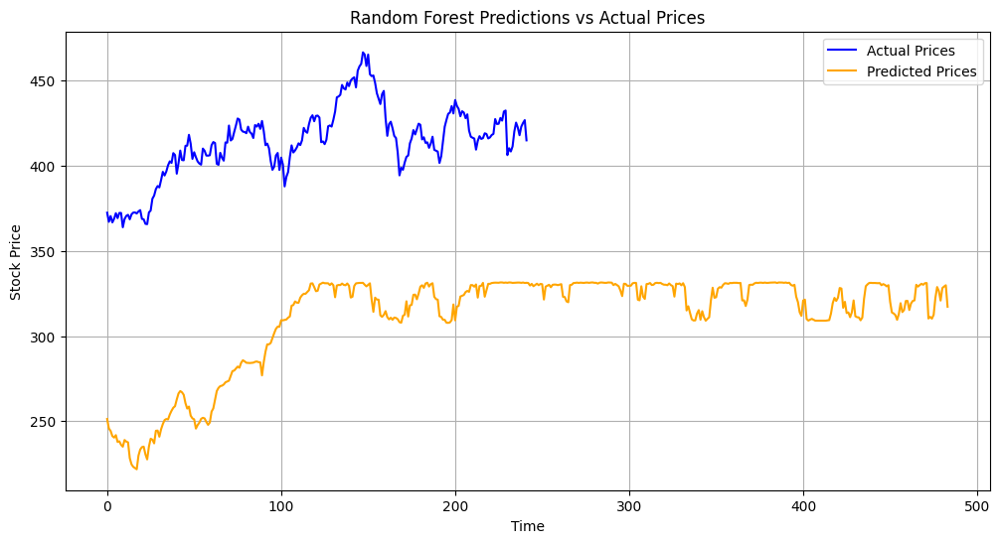

In [44]:
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label="Actual Prices", color='blue')
plt.plot(predictions_rescaled, label="Predicted Prices", color='orange')
plt.legend()
plt.title("Random Forest Predictions vs Actual Prices")
plt.xlabel("Time")
plt.ylabel("Stock Price")
plt.grid()
plt.show()


In [24]:
# Interpretation:

# MSE: Measures error magnitude; lower is better.
# MAE: Indicates the average error in prediction.
# R-squared: Ranges from 0 to 1; higher values indicate better model fit. Negative R^2 
# suggests the model performs worse than a naive mean prediction.

In [25]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")


MSE: 5171.490290163567
MAE: 54.3836343331279
R-squared: -0.2002029577354003


Random Forest Evaluation:
MSE: 1872.0284148404883
MAE: 38.695690592771605
R-squared: -3.03296855744735
Epoch 1/20


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.1209
Epoch 2/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0054
Epoch 3/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0028
Epoch 4/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0016
Epoch 5/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 9.4868e-04
Epoch 6/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 6.4035e-04
Epoch 7/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 6.0803e-04
Epoch 8/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 5.0817e-04
Epoch 9/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 5.4497e-04
Epoch 10/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 5.1795e-04
Epoch 11/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 4.7461e-04
Epoch 12/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 4.9315e-04
Epoch 13/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 4.9476e-04
Epoch 14/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 4.6389e-04
Epoch 15/20
31/31 ━━━━━━━━━━

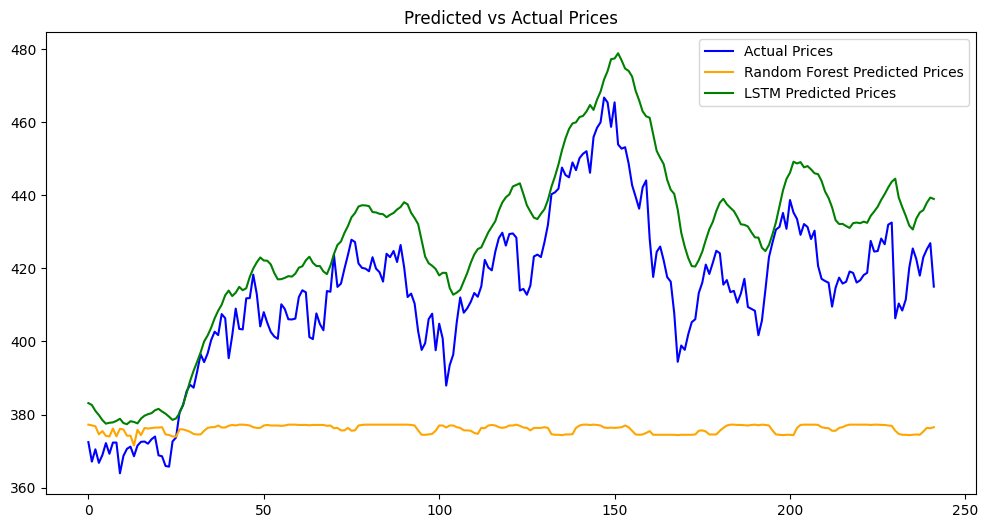

In [26]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Step 1: Pull MSFT data
msft = yf.Ticker("MSFT")
hist = msft.history(period="5y")

# Step 2: Add additional features
hist['SMA_10'] = hist['Close'].rolling(window=10).mean()  # 10-day Simple Moving Average
hist['SMA_50'] = hist['Close'].rolling(window=50).mean()  # 50-day Simple Moving Average
hist['EMA_10'] = hist['Close'].ewm(span=10, adjust=False).mean()  # Exponential Moving Average
hist['Volume_Change'] = hist['Volume'].pct_change()  # Percent Change in Volume
hist['Rolling_Std'] = hist['Close'].rolling(window=10).std()  # Rolling Standard Deviation

# Add lagged features for past 5 days
for lag in range(1, 6):
    hist[f'Lag_{lag}'] = hist['Close'].shift(lag)

# Drop NaN rows caused by rolling and lagging
hist.dropna(inplace=True)

# Step 3: Define features (X) and target (y)
X = hist[['SMA_10', 'SMA_50', 'EMA_10', 'Volume_Change', 'Rolling_Std'] + [f'Lag_{lag}' for lag in range(1, 6)]]
y = hist['Close']

# Step 4: Normalize features and target
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1))

# Step 5: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, shuffle=False)

# Step 6: Hyperparameter tuning for Random Forest
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=RandomForestRegressor(), param_grid=param_grid, cv=3)
grid_search.fit(X_train, y_train.ravel())

# Use the best Random Forest model
rf_model = grid_search.best_estimator_

# Step 7: Make predictions with Random Forest
rf_predictions = rf_model.predict(X_test)
rf_predictions_rescaled = scaler_y.inverse_transform(rf_predictions.reshape(-1, 1))
y_test_rescaled = scaler_y.inverse_transform(y_test)

# Step 8: Evaluate Random Forest model
rf_mse = mean_squared_error(y_test_rescaled, rf_predictions_rescaled)
rf_mae = mean_absolute_error(y_test_rescaled, rf_predictions_rescaled)
rf_r2 = r2_score(y_test_rescaled, rf_predictions_rescaled)

print("Random Forest Evaluation:")
print(f"MSE: {rf_mse}")
print(f"MAE: {rf_mae}")
print(f"R-squared: {rf_r2}")

# Step 9: Build and train LSTM model
# Reshape input data for LSTM (samples, timesteps, features)
X_train_lstm = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_lstm = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train_lstm, y_train, epochs=20, batch_size=32, verbose=1)

# Step 10: Make predictions with LSTM
lstm_predictions = model.predict(X_test_lstm)
lstm_predictions_rescaled = scaler_y.inverse_transform(lstm_predictions)

# Step 11: Evaluate LSTM model
lstm_mse = mean_squared_error(y_test_rescaled, lstm_predictions_rescaled)
lstm_mae = mean_absolute_error(y_test_rescaled, lstm_predictions_rescaled)
lstm_r2 = r2_score(y_test_rescaled, lstm_predictions_rescaled)

print("\nLSTM Evaluation:")
print(f"MSE: {lstm_mse}")
print(f"MAE: {lstm_mae}")
print(f"R-squared: {lstm_r2}")

# Step 12: Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label="Actual Prices", color='blue')
plt.plot(rf_predictions_rescaled, label="Random Forest Predicted Prices", color='orange')
plt.plot(lstm_predictions_rescaled, label="LSTM Predicted Prices", color='green')
plt.legend()
plt.title("Predicted vs Actual Prices")
plt.show()


Random Forest Evaluation:
MSE: 4114.976435531306
MAE: 46.70283143356922
R-squared: 0.044993480022465504
Epoch 1/50


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 685us/step - loss: 0.0487
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0014
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 3.8120e-04
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 2.1297e-04
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 1.0719e-04
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 5.9474e-05
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 4.8195e-05
Epoch 8/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 3.7835e-05
Epoch 9/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 3.5676e-05
Epoch 10/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 3.4205e-05
Epoch 11/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 2.9565e-05
Epoch 12/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 3.0422e-05
Epoch 13/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 3.3009e-05
Epoch 14/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 2.9422e-05
Epoch 15/50
62/62 ━━

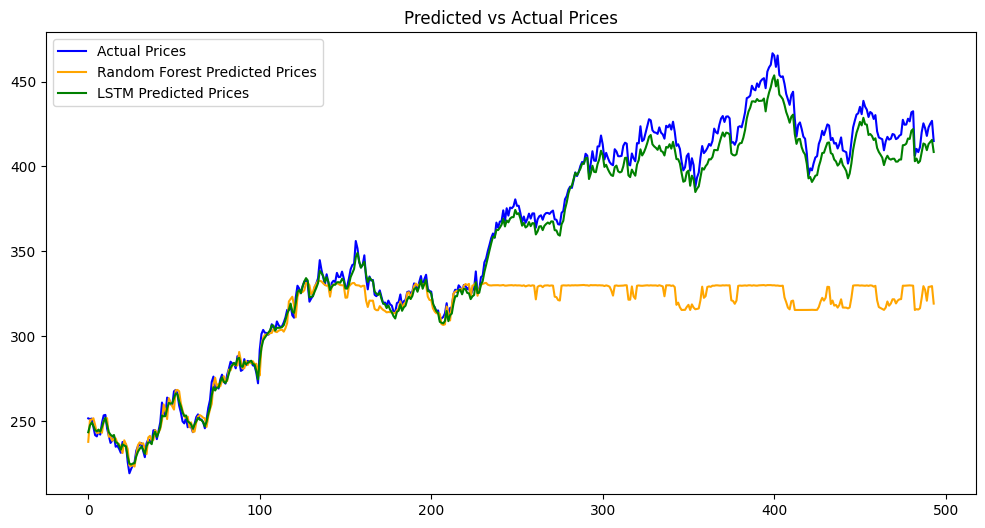

In [27]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from ta.momentum import RSIIndicator
from ta.volatility import BollingerBands

# Step 1: Pull MSFT data (10 years for better trends)
msft = yf.Ticker("MSFT")
hist = msft.history(period="10y")

# Step 2: Add additional features
hist['SMA_10'] = hist['Close'].rolling(window=10).mean()  # 10-day Simple Moving Average
hist['SMA_50'] = hist['Close'].rolling(window=50).mean()  # 50-day Simple Moving Average
hist['EMA_10'] = hist['Close'].ewm(span=10, adjust=False).mean()  # Exponential Moving Average
hist['Volume_Change'] = hist['Volume'].pct_change()  # Percent Change in Volume
hist['Rolling_Std'] = hist['Close'].rolling(window=10).std()  # Rolling Standard Deviation

# Add RSI and Bollinger Bands
rsi = RSIIndicator(hist['Close'], window=14)
hist['RSI'] = rsi.rsi()
bollinger = BollingerBands(hist['Close'], window=20)
hist['BB_High'] = bollinger.bollinger_hband()
hist['BB_Low'] = bollinger.bollinger_lband()

# Add lagged features for past 5 days
for lag in range(1, 6):
    hist[f'Lag_{lag}'] = hist['Close'].shift(lag)

# Drop NaN rows caused by rolling and lagging
hist.dropna(inplace=True)

# Step 3: Define features (X) and target (y)
X = hist[['SMA_10', 'SMA_50', 'EMA_10', 'Volume_Change', 'Rolling_Std', 'RSI', 'BB_High', 'BB_Low'] + [f'Lag_{lag}' for lag in range(1, 6)]]
y = hist['Close']

# Step 4: Normalize features and target
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1))

# Step 5: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, shuffle=False)

# Step 6: Train Random Forest with optimized parameters
rf_model = RandomForestRegressor(n_estimators=300, max_depth=10, random_state=42)
rf_model.fit(X_train, y_train.ravel())

# Step 7: Make predictions with Random Forest
rf_predictions = rf_model.predict(X_test)
rf_predictions_rescaled = scaler_y.inverse_transform(rf_predictions.reshape(-1, 1))
y_test_rescaled = scaler_y.inverse_transform(y_test)

# Step 8: Evaluate Random Forest model
rf_mse = mean_squared_error(y_test_rescaled, rf_predictions_rescaled)
rf_mae = mean_absolute_error(y_test_rescaled, rf_predictions_rescaled)
rf_r2 = r2_score(y_test_rescaled, rf_predictions_rescaled)

print("Random Forest Evaluation:")
print(f"MSE: {rf_mse}")
print(f"MAE: {rf_mae}")
print(f"R-squared: {rf_r2}")

# Step 9: Build and train LSTM model
# Reshape input data for LSTM (samples, timesteps, features)
X_train_lstm = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_lstm = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train_lstm, y_train, epochs=50, batch_size=32, verbose=1)  # Increased epochs for better learning

# Step 10: Make predictions with LSTM
lstm_predictions = model.predict(X_test_lstm)
lstm_predictions_rescaled = scaler_y.inverse_transform(lstm_predictions)

# Step 11: Evaluate LSTM model
lstm_mse = mean_squared_error(y_test_rescaled, lstm_predictions_rescaled)
lstm_mae = mean_absolute_error(y_test_rescaled, lstm_predictions_rescaled)
lstm_r2 = r2_score(y_test_rescaled, lstm_predictions_rescaled)

print("\nLSTM Evaluation:")
print(f"MSE: {lstm_mse}")
print(f"MAE: {lstm_mae}")
print(f"R-squared: {lstm_r2}")

# Step 12: Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label="Actual Prices", color='blue')
plt.plot(rf_predictions_rescaled, label="Random Forest Predicted Prices", color='orange')
plt.plot(lstm_predictions_rescaled, label="LSTM Predicted Prices", color='green')
plt.legend()
plt.title("Predicted vs Actual Prices")
plt.show()


In [ ]:
# MSFT price prediction by the end of Dec 2024

Epoch 1/20


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 739us/step - loss: 0.1246
Epoch 2/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0065
Epoch 3/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0038
Epoch 4/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0032
Epoch 5/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0028
Epoch 6/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0025
Epoch 7/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0022
Epoch 8/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0023
Epoch 9/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0023
Epoch 10/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0023
Epoch 11/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0022
Epoch 12/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0024
Epoch 13/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0020
Epoch 14/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0020
Epoch 15/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0022


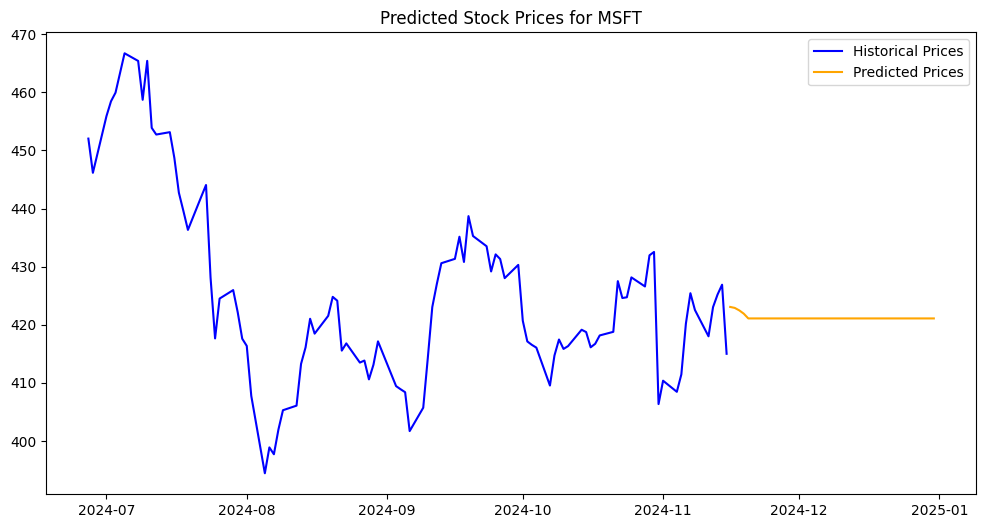

Predicted MSFT stock price on 2024-12-31: $421.09


In [36]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Step 1: Pull MSFT data
msft = yf.Ticker("MSFT")
hist = msft.history(period="5y")  # Last 5 years of data

# Step 2: Add additional features
hist['SMA_10'] = hist['Close'].rolling(window=10).mean()  # 10-day Simple Moving Average
hist['SMA_50'] = hist['Close'].rolling(window=50).mean()  # 50-day Simple Moving Average
hist['EMA_10'] = hist['Close'].ewm(span=10, adjust=False).mean()  # Exponential Moving Average
hist['Volume_Change'] = hist['Volume'].pct_change()  # Percent Change in Volume
hist['Rolling_Std'] = hist['Close'].rolling(window=10).std()  # Rolling Standard Deviation

# Add lagged features for the past 5 days
for lag in range(1, 6):
    hist[f'Lag_{lag}'] = hist['Close'].shift(lag)

# Drop NaN rows caused by rolling and lagging
hist.dropna(inplace=True)

# Step 3: Define features (X) and target (y)
features = ['SMA_10', 'SMA_50', 'EMA_10', 'Volume_Change', 'Rolling_Std'] + [f'Lag_{lag}' for lag in range(1, 6)]
X = hist[features]
y = hist['Close']

# Step 4: Normalize features and target
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1))

# Step 5: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, shuffle=False)

# Step 6: Build and train the LSTM model
X_train_lstm = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_lstm = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train_lstm, y_train, epochs=20, batch_size=32, verbose=1)

# Step 7: Predict future prices up to Dec 2024
start_date = pd.Timestamp(hist.index[-1]).tz_localize(None) + pd.Timedelta(days=1)
future_dates = pd.date_range(start=start_date, end='2024-12-31', freq='D')
future_features = hist.iloc[-1][features].to_dict()  # Initialize with the last row of features
predicted_prices = []

# Generate predictions dynamically
for date in future_dates:
    # Update lagged features
    for lag in range(5, 1, -1):
        future_features[f'Lag_{lag}'] = future_features.get(f'Lag_{lag - 1}')
    future_features['Lag_1'] = future_features['SMA_10']  # Use SMA_10 as a proxy for the last closing price

    # Update other features dynamically
    input_features = pd.DataFrame([future_features], columns=features)  # Ensure correct feature order
    input_scaled = scaler_X.transform(input_features)
    input_lstm = input_scaled.reshape((1, 1, input_scaled.shape[1]))

    predicted_price = model.predict(input_lstm)
    predicted_price_rescaled = scaler_y.inverse_transform(predicted_price)

    # Update the "Close" feature for the next prediction
    future_features['SMA_10'] = hist['Close'].rolling(window=10).mean().iloc[-1]
    future_features['SMA_50'] = hist['Close'].rolling(window=50).mean().iloc[-1]
    future_features['EMA_10'] = hist['Close'].ewm(span=10, adjust=False).mean().iloc[-1]
    future_features['Volume_Change'] = hist['Volume'].pct_change().iloc[-1]
    future_features['Rolling_Std'] = hist['Close'].rolling(window=10).std().iloc[-1]
    future_features['Close'] = predicted_price_rescaled[0, 0]

    # Store the predicted price
    predicted_prices.append(predicted_price_rescaled[0, 0])

# Step 8: Plot future predictions
plt.figure(figsize=(12, 6))
plt.plot(hist.index[-100:], hist['Close'][-100:], label="Historical Prices", color='blue')
plt.plot(future_dates, predicted_prices, label="Predicted Prices", color='orange')
plt.title("Predicted Stock Prices for MSFT")
plt.legend()
plt.show()

# Print the predicted price on the last date
print(f"Predicted MSFT stock price on {future_dates[-1].date()}: ${predicted_prices[-1]:.2f}")
